**Setup**

Importamos las librerías necesarias de keras y tensorflow.

In [8]:
import os, math, json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt # visualizar datos
import seaborn as sns # visualizar datos
import tensorflow as tf

# Reproducibilidad (opcional)
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

**Descargamos el fichero .zip**

In [9]:
!pip install -q gdown
!rm -rf data.zip
!gdown --fuzzy 1MTVj4yPyZTt_IkHSkeRwvH_GGw3nx3co -O data.zip

Downloading...
From (original): https://drive.google.com/uc?id=1MTVj4yPyZTt_IkHSkeRwvH_GGw3nx3co
From (redirected): https://drive.google.com/uc?id=1MTVj4yPyZTt_IkHSkeRwvH_GGw3nx3co&confirm=t&uuid=7d8d31eb-c6b1-4db8-9687-4f6d7e279d17
To: /content/data.zip
100% 511M/511M [00:10<00:00, 50.6MB/s]


**Descomprimimos**

In [10]:
!rm -rf data
!unzip -q data.zip -d data
!ls data/


class_indices.json  drugs  inventory.csv  safe	sexual	violence  war  weapons


**Leemos el CSV y limpiamos un poco el fichero**

In [11]:
## crear DataFrame desde csv
df = pd.read_csv('data/inventory.csv')

# Ver las primeras filas
print(df.head())
# Eliminamos columnas inecesarias
df = df.drop(columns=['timestamps_extracted', 'source_type', 'output_path', 'filename'])

# Convertir las rutas de Windows (\) a Linux (/)
df["relative_path"] = df["relative_path"].str.replace("\\", "/", regex=False)

# Ver las últimas filas despues de la limpieza de columnas
print("\n\nFichero final:\n", df.tail())

  category source_type          filename timestamps_extracted  \
0    drugs       image  drugs4_1675.jpeg                  NaN   
1    drugs       image  drugs4_0895.jpeg                  NaN   
2    drugs       image   drugs4_0493.jpg                  NaN   
3    drugs       image  drugs4_1021.jpeg                  NaN   
4    drugs       image   drugs4_0267.jpg                  NaN   

                                    output_path                relative_path  \
0  C:\proyectos\TFM\data\drugs\drugs4_1675.jpeg  data\drugs\drugs4_1675.jpeg   
1  C:\proyectos\TFM\data\drugs\drugs4_0895.jpeg  data\drugs\drugs4_0895.jpeg   
2   C:\proyectos\TFM\data\drugs\drugs4_0493.jpg   data\drugs\drugs4_0493.jpg   
3  C:\proyectos\TFM\data\drugs\drugs4_1021.jpeg  data\drugs\drugs4_1021.jpeg   
4   C:\proyectos\TFM\data\drugs\drugs4_0267.jpg   data\drugs\drugs4_0267.jpg   

   split  
0  train  
1  train  
2  train  
3  train  
4  train  


Fichero final:
       category                     relative_

**Comprobamos correcta formación de rutas relativas**

🖼️ Mostrando primera imagen de la categoría 'violence': data/violence/frames/train/frame_V_371_000001.jpg


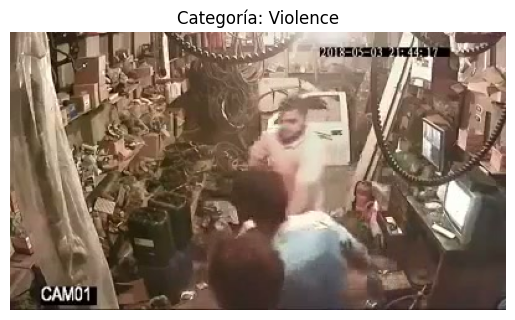

In [12]:
import matplotlib.image as mpimg
# Filtrar la categoría "violence"
df_violence = df[df["category"] == "violence"]

# Comprobar si hay imágenes disponibles
if not df_violence.empty:
    # Tomar la primera ruta
    img_path = df_violence["relative_path"].iloc[0]
    print(f"🖼️ Mostrando primera imagen de la categoría 'violence': {img_path}")

    # Cargar y mostrar la imagen
    img = mpimg.imread(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title("Categoría: Violence")
    plt.show()
else:
    print("⚠️ No se encontraron imágenes en la categoría 'violence'.")

**Graficamos representación de categorias en el total de imágenes**

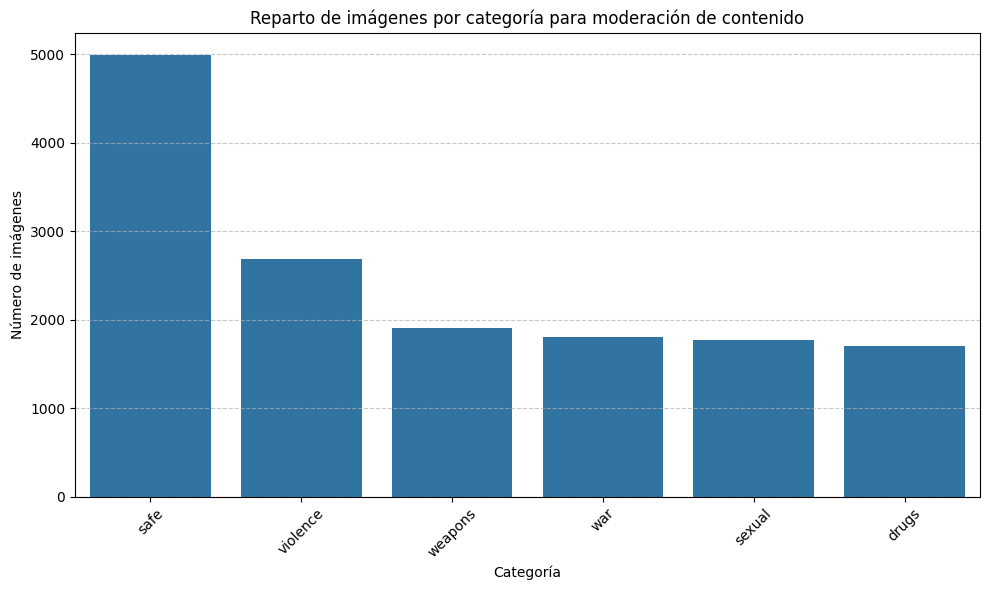

In [13]:
import seaborn as sns

category_counts = df['category'].value_counts()
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='category', order=category_counts.index, legend=False)
plt.title('Reparto de imágenes por categoría para moderación de contenido')
plt.xlabel('Categoría')
plt.ylabel('Número de imágenes')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

**Separar split**

In [14]:
# Separar por split (train/val/test)
df_train = df[df['split'] == 'train'].reset_index(drop=True)
df_val   = df[df['split'] == 'val'].reset_index(drop=True)
df_test  = df[df['split'] == 'test'].reset_index(drop=True)

print("Train samples:", len(df_train), "Val samples:", len(df_val), "Test samples:", len(df_test))

Train samples: 11887 Val samples: 1486 Test samples: 1489


**Calcular BATCH SIZE y Parámetros de configuración**

In [18]:
import subprocess
import re
import tensorflow as tf

# =========================
#   DETECTAR VRAM GPU
# =========================
def detect_batch_size():
    # 1. Detectar si existe una GPU visible para TensorFlow
    gpus = tf.config.list_physical_devices("GPU")
    if not gpus:
        print("⚠ No GPU detectada. Usando BATCH_SIZE = 16")
        return 16

    try:
        # 2. Ejecutar nvidia-smi para obtener la VRAM total en MiB
        result = subprocess.run(
            ["nvidia-smi", "--query-gpu=memory.total", "--format=csv,noheader,nounits"],
            stdout=subprocess.PIPE,
            stderr=subprocess.PIPE,
            text=True
        )
        total_vram_mib = int(result.stdout.strip())
        total_vram_bytes = total_vram_mib * 1024 * 1024
    except Exception as e:
        print("⚠ No se pudo obtener VRAM con nvidia-smi:", e)
        print("Usando BATCH_SIZE = 32")
        return 32

    total_vram_gb = total_vram_bytes / 1e9
    print(f"VRAM detectada: {total_vram_gb:.1f} GB")

    # 3. Reglas para batch_size
    if total_vram_bytes > 16e9:
        return 64
    elif total_vram_bytes > 10e9:
        return 48
    else:
        return 32

# -------------------------
# DATASET Y CONFIG - USO REAL según GPU detectada:
# -------------------------
BATCH_SIZE = detect_batch_size()
TARGET_SIZE = (300, 300)        # tamaño de entrada para EfficientNetB0 (224x224)
CLASS_MODE = 'categorical'      # tienes 6 clases -> one-hot encoding
NUM_CLASSES = df['category'].nunique()
DATASET_SIZE = len(df)

# Epochs adaptados al tamaño del dataset
if DATASET_SIZE > 20000:
    initial_epochs = 30
elif DATASET_SIZE > 12000:
    initial_epochs = 25
else:
    initial_epochs = 20

print(f"Dataset total: {DATASET_SIZE}, Initial epochs: {initial_epochs}, Batch size: {BATCH_SIZE}")

# pasos por época
train_steps = math.ceil(len(df_train) / BATCH_SIZE)
val_steps   = math.ceil(len(df_val) / BATCH_SIZE)
test_steps  = math.ceil(len(df_test) / BATCH_SIZE)

print(f"Num clases: {NUM_CLASSES}, Train steps: {train_steps}, Val steps: {val_steps}")

VRAM detectada: 16.1 GB
Dataset total: 14862, Initial epochs: 25, Batch size: 64
Num clases: 6, Train steps: 186, Val steps: 24


**Generadores de datos con Data Augmentation en training**

In [19]:
from tensorflow.keras import layers, models, callbacks, optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB3
from tensorflow.keras.applications.efficientnet import preprocess_input as eff_preprocess

# Parámetros de aumentos que ayudan a generalizar(rotation_range, shift, zoom, flip, etc)
train_datagen = ImageDataGenerator(
    preprocessing_function=eff_preprocess,  # Aplica escalado y normalización específica de EfficientNetB3.
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.08,
    zoom_range=0.15,
    horizontal_flip=True,
    brightness_range=(0.85, 1.15),
    fill_mode='nearest'
)

# Para validation / test sólo preprocess_input, sin augmentation
val_datagen = ImageDataGenerator(preprocessing_function=eff_preprocess)
test_datagen = ImageDataGenerator(preprocessing_function=eff_preprocess)

# -----------------------------
# flow_from_dataframe para leer imágenes desde inventory.csv
# -----------------------------
# Nota: x_col debe apuntar a la ruta de imagen en cada fila, y_col a la categoría
# low_from_dataframe lee rutas directas de IMÁGENES en csv
train_generator = train_datagen.flow_from_dataframe(
    dataframe=df_train,
    x_col='relative_path',
    y_col='category',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode=CLASS_MODE,   # 'categorical' => one-hot
    batch_size=BATCH_SIZE,
    shuffle=True, # Solo para train para mezclar las imágenes.
    seed=SEED
)

validation_generator = val_datagen.flow_from_dataframe(
    dataframe=df_val,
    x_col='relative_path',
    y_col='category',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode=CLASS_MODE, # devuelve arrays shape (batch, num_classes)
    batch_size=BATCH_SIZE,
    shuffle=False          # False para val/test para reproducibilidad.
)

test_generator = test_datagen.flow_from_dataframe(
    dataframe=df_test,
    x_col='relative_path',
    y_col='category',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode=CLASS_MODE, # devuelve arrays shape (batch, num_classes)
    batch_size=BATCH_SIZE,
    shuffle=False          # False para val/test para reproducibilidad.
)

# Finalmente guardamos los indices para usarlos en el mismo orden en la inferencia
import json
with open('class_indices.json', 'w') as f:
    json.dump(train_generator.class_indices, f)

Found 11865 validated image filenames belonging to 6 classes.
Found 1485 validated image filenames belonging to 6 classes.
Found 1485 validated image filenames belonging to 6 classes.


/usr/local/lib/python3.12/dist-packages/keras/src/legacy/preprocessing/image.py:920: UserWarning: Found 22 invalid image filename(s) in x_col="relative_path". These filename(s) will be ignored.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/legacy/preprocessing/image.py:920: UserWarning: Found 1 invalid image filename(s) in x_col="relative_path". These filename(s) will be ignored.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/legacy/preprocessing/image.py:920: UserWarning: Found 4 invalid image filename(s) in x_col="relative_path". These filename(s) will be ignored.
  warnings.warn(


**Calcular class_weight automáticamente** (si existe desbalance)

In [20]:
from sklearn.utils.class_weight import compute_class_weight

labels = df_train['category'].values
classes = np.unique(labels)
# compute_class_weight requiere arrays numéricos, mapeamos categories a índices según train_generator
cat_to_idx = train_generator.class_indices  # ej {"drugs":0, ...}
# mapear labels text a índices
y_indices = np.array([cat_to_idx[c] for c in labels])
weights = compute_class_weight(class_weight='balanced', classes=np.arange(len(classes)), y=y_indices)
class_weights = dict(enumerate(weights))
print("Class weights:", class_weights)
print("Indices de clases:", train_generator.class_indices)

Class weights: {0: np.float64(1.4546010768477728), 1: np.float64(0.49628423513694053), 2: np.float64(1.4001177856301532), 3: np.float64(0.9227604409253222), 4: np.float64(1.3710495963091118), 5: np.float64(1.2982743556138052)}
Indices de clases: {'drugs': 0, 'safe': 1, 'sexual': 2, 'violence': 3, 'war': 4, 'weapons': 5}


**Construir el modelo con EfficientNetB3 + Fine Tuning (transfer learning + head)**

In [21]:
base_model = EfficientNetB3(
    weights='imagenet',
    include_top=False, # EfficientNetB3 sin la parte superior
    input_shape=(TARGET_SIZE[0], TARGET_SIZE[1], 3)
)

# 1) Congelar la base convolucional inicialmente (entrenamos solo la cabeza primero)
base_model.trainable = False

# 2) Definir la cabeza (new classifier head)
inputs = layers.Input(shape=(TARGET_SIZE[0], TARGET_SIZE[1], 3))
x = base_model(inputs, training=False)      # usa base en modo inference para batchnorm estable
x = layers.GlobalAveragePooling2D()(x)      # reduce las dimensiones.
x = layers.Dropout(0.5)(x)                  # agregan capacidad y regularización.
x = layers.Dense(512, activation='relu')(x) # agregan capacidad y regularización. (256 para 8K)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(NUM_CLASSES, activation='softmax')(x)
model = models.Model(inputs, outputs)

# 3) Compilar modelo inicial (solo capas superiores entrenables)
# lr más conservador que 1e-3: 1e-4 suele funcionar mejor para cabeza cuando base está preload
model.compile(
    optimizer=optimizers.Adam(learning_rate=1e-4), # (1e-3 para 8K)
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 300, 300, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb3 (Functional)     │ (None, 10, 10, 1536)   │    10,783,535 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1536)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1536)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       786,944 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 6)              │         3,078 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,573,557 (44.15 MB)

 Trainable params: 790,022 (3.01 MB)

 Non-trainable params: 10,783,535 (41.14 MB)

**Callbacks y entrenamiento inicial**

In [23]:
callbacks_fase1 = [
    tf.keras.callbacks.ModelCheckpoint(   # guarda el mejor modelo por val_loss durante esta fase
        "effnetB3_initial.keras",
        monitor="val_loss",
        save_best_only=True
    ),
    tf.keras.callbacks.EarlyStopping(    # para evitar entrenar demasiado y sobreajustar (patience=5 para 8K)
        monitor="val_loss",
        patience=6,
        restore_best_weights=True
    ),
    tf.keras.callbacks.ReduceLROnPlateau( # baja lr si no mejora
        monitor="val_loss",
        factor=0.5,
        patience=3,
        min_lr=1e-7
    )
]

**Entrenar solo la cabeza durante N epochs**

Fase 1: Entrenamiento inicial (feature extraction) Entrenamiento rápido para ajustar la cabeza densa encima de características preentrenadas.

Evita que el modelo se sesgue desde el inicio

In [24]:
history1 = model.fit(
    train_generator,
    steps_per_epoch=train_steps,
    epochs=initial_epochs,
    validation_data=validation_generator,
    validation_steps=val_steps,
    callbacks=callbacks_fase1,
    class_weight=class_weights  # aplicamos balanceo por clase
)

# Guardar modelo inicial
#model.save("effnetB3_initial.h5")

# Guardar solo el número de epochs del primer entrenamiento
metadata = {
    "history": history1.history,
    "initial_epoch": len(history1.history["accuracy"]),
    "class_weights": class_weights #{int(k): float(v) for k, v in class_weights.items()}
}


with open("training_history1.json", "w") as f:
    json.dump(metadata, f)

# Informes rápidos
print("\nFase 1 finalizada.")
print("Última train acc:", history1.history['accuracy'][-1])
print("Última val acc:", history1.history['val_accuracy'][-1])

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
125/186 ━━━━━━━━━━━━━━━━━━━━ 1:46 2s/step - accuracy: 0.3852 - loss: 1.5267

/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


186/186 ━━━━━━━━━━━━━━━━━━━━ 400s 2s/step - accuracy: 0.4450 - loss: 1.3921 - val_accuracy: 0.7892 - val_loss: 0.6768 - learning_rate: 1.0000e-04
Epoch 2/25
186/186 ━━━━━━━━━━━━━━━━━━━━ 292s 2s/step - accuracy: 0.7543 - loss: 0.6283 - val_accuracy: 0.8202 - val_loss: 0.5366 - learning_rate: 1.0000e-04
Epoch 3/25
186/186 ━━━━━━━━━━━━━━━━━━━━ 295s 2s/step - accuracy: 0.7898 - loss: 0.5215 - val_accuracy: 0.8404 - val_loss: 0.4760 - learning_rate: 1.0000e-04
Epoch 4/25
186/186 ━━━━━━━━━━━━━━━━━━━━ 301s 2s/step - accuracy: 0.8073 - loss: 0.4766 - val_accuracy: 0.8525 - val_loss: 0.4501 - learning_rate: 1.0000e-04
Epoch 5/25
186/186 ━━━━━━━━━━━━━━━━━━━━ 293s 2s/step - accuracy: 0.8140 - loss: 0.4668 - val_accuracy: 0.8667 - val_loss: 0.4090 - learning_rate: 1.0000e-04
Epoch 6/25
186/186 ━━━━━━━━━━━━━━━━━━━━ 292s 2s/step - accuracy: 0.8350 - loss: 0.4264 - val_accuracy: 0.8741 - val_loss: 0.3905 - learning_rate: 1.0000e-04
Epoch 7/25
186/186 ━━━━━━━━━━━━━━━━━━━━ 294s 2s/step - accuracy: 0.83

**Fine-tuning: descongelar las últimas capas del base_model**

Fase 2. Para evitar que se desconecte, se adapta codigo para ejecutarse Fase 1 y Fase 2 de entrenamiento de manera independiente

In [25]:
import json
import math
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import load_model
from tensorflow.keras import optimizers, callbacks

SEED = 42

# =========================
# CARGAR METADATA + MODELO
# =========================
with open("training_history1.json", "r") as f:
    metadata = json.load(f)

#history1_data = metadata["history"]
initial_epoch = metadata["initial_epoch"]
class_weights = metadata["class_weights"]
print("Continuando desde epoch:", initial_epoch)

model = load_model("effnetB3_initial.keras")

# ======================================================
# IDENTIFICAR EL base_model DENTRO DEL MODELO CARGADO
# ======================================================
# EfficientNetB3 suele estar como primera capa del modelo final
# pero dependiendo del código, puede tener otro índice o nombre.
try:
    base_model = model.layers[1]  # usualmente correcto
    #print("model.layers[0]: ", model.layers[0])
    #print("Base model.layers[1]: ", model.layers[1])
except:
    base_model = model.get_layer("efficientnetb3")
    print("Base model encontrado mediante get_layer('efficientnetb3')")

# =========================
#  DATASET
# =========================
df = pd.read_csv("data/inventory.csv")
df = df.drop(columns=['timestamps_extracted','source_type','output_path','filename'])
df["relative_path"] = df["relative_path"].str.replace("\\","/",regex=False)

df_train = df[df['split']=="train"].reset_index(drop=True)
df_val   = df[df['split']=="val"].reset_index(drop=True)

# Reusar class indices
with open("class_indices.json","r") as f:
    class_indices = json.load(f)

NUM_CLASSES = len(class_indices)

# Congelar las primeras N layers y dejar entrenables las últimas M
# Entrenamos solo las últimas ~50 capas de EfficientNetB3 (ajusta si tienes más datos o GPU).
# =========================
#  FINE-TUNE CONFIG
# =========================
DATASET_SIZE = len(df)
#BATCH_SIZE = 64  # Si es con la vran de Google colab
BATCH_SIZE = detect_batch_size()

if DATASET_SIZE > 20000:
    fine_tune_epochs = 50
    fine_tune_at = len(base_model.layers) - 80
else:
    fine_tune_epochs = 40
    fine_tune_at = len(base_model.layers) - 50

print("Fine tuning desde layer:", fine_tune_at)

# =========================
#  DESCONGELAR ÚLTIMAS CAPAS
# =========================
base_model.trainable = True
for i, layer in enumerate(base_model.layers):
    layer.trainable = (i >= fine_tune_at)     # layer.trainable = True if i >= fine_tune_at else False

# Compilar con un learning rate muy bajo
model.compile(
    optimizer=optimizers.Adam(learning_rate=1e-5), # para evitar dañar pesos preentrenados.
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# =========================
#  GENERATORS
# =========================
from tensorflow.keras.applications.efficientnet import preprocess_input
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
val_datagen   = ImageDataGenerator(preprocessing_function=preprocess_input)

train_gen = train_datagen.flow_from_dataframe(
    df_train,
    x_col='relative_path',
    y_col='category',
    target_size=(300,300),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)
val_gen = val_datagen.flow_from_dataframe(
    df_val,x_col='relative_path',y_col='category',
    target_size=(300,300),batch_size=BATCH_SIZE,class_mode='categorical'
)

train_steps = math.ceil(len(df_train)/BATCH_SIZE)
val_steps   = math.ceil(len(df_val)/BATCH_SIZE)

# =========================
# CALLBACKS para guardar el mejor modelo fine-tuned
# =========================
callbacks_fase2 = [
    tf.keras.callbacks.ModelCheckpoint(
        "effnetB3_finetuned.keras",
        monitor="val_loss",
        save_best_only=True
    ),
    #tf.keras.callbacks.EarlyStopping(
    #    monitor="val_loss",
    #    patience=6,                     # patience=6~8
    #    restore_best_weights=True
    #),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.5,
        patience=4,                    # patience=3~4. No se usaba para 8K
        min_lr=1e-7
    )
]

total_epochs = initial_epoch + fine_tune_epochs

# =========================
# ENTRENAR
# =========================
history2 = model.fit(
    train_gen,
    steps_per_epoch=train_steps,
    epochs=total_epochs,
    initial_epoch=initial_epoch,   # YA NO SE USA history1
    validation_data=val_gen,
    validation_steps=val_steps,
    callbacks=callbacks_fase2,     # Se incluye reduce_lr_ft (8K no estaba)
    class_weight=class_weights     # Nuevo, antes en 8K no lo usaba
)

metadata = {
    "history": history2.history
}

with open("training_history2.json", "w") as f:
    json.dump(metadata, f)

print("\nFine-tuning finalizado.")
print("Última train acc:", history2.history['accuracy'][-1])
print("Última val acc:", history2.history['val_accuracy'][-1])


Continuando desde epoch: 25
VRAM detectada: 16.1 GB
Fine tuning desde layer: 335
Found 11865 validated image filenames belonging to 6 classes.
Found 1485 validated image filenames belonging to 6 classes.


/usr/local/lib/python3.12/dist-packages/keras/src/legacy/preprocessing/image.py:920: UserWarning: Found 22 invalid image filename(s) in x_col="relative_path". These filename(s) will be ignored.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/legacy/preprocessing/image.py:920: UserWarning: Found 1 invalid image filename(s) in x_col="relative_path". These filename(s) will be ignored.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 26/65
113/186 ━━━━━━━━━━━━━━━━━━━━ 40s 561ms/step - accuracy: 0.8439 - loss: 0.4573

/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


186/186 ━━━━━━━━━━━━━━━━━━━━ 167s 604ms/step - accuracy: 0.8504 - loss: 0.4402 - val_accuracy: 0.8976 - val_loss: 0.2903 - learning_rate: 1.0000e-05
Epoch 27/65
186/186 ━━━━━━━━━━━━━━━━━━━━ 64s 343ms/step - accuracy: 0.8971 - loss: 0.3308 - val_accuracy: 0.9051 - val_loss: 0.2753 - learning_rate: 1.0000e-05
Epoch 28/65
186/186 ━━━━━━━━━━━━━━━━━━━━ 81s 342ms/step - accuracy: 0.9047 - loss: 0.2910 - val_accuracy: 0.9104 - val_loss: 0.2610 - learning_rate: 1.0000e-05
Epoch 29/65
186/186 ━━━━━━━━━━━━━━━━━━━━ 82s 339ms/step - accuracy: 0.9098 - loss: 0.2583 - val_accuracy: 0.9118 - val_loss: 0.2490 - learning_rate: 1.0000e-05
Epoch 30/65
186/186 ━━━━━━━━━━━━━━━━━━━━ 63s 336ms/step - accuracy: 0.9203 - loss: 0.2365 - val_accuracy: 0.9152 - val_loss: 0.2410 - learning_rate: 1.0000e-05
Epoch 31/65
186/186 ━━━━━━━━━━━━━━━━━━━━ 63s 336ms/step - accuracy: 0.9288 - loss: 0.2256 - val_accuracy: 0.9152 - val_loss: 0.2322 - learning_rate: 1.0000e-05
Epoch 32/65
186/186 ━━━━━━━━━━━━━━━━━━━━ 63s 340ms/

**Evaluación en test**

Cargamos el checkpoint mejor y evaluamos contra el generador de test.

In [26]:
model.load_weights('effnetB3_finetuned.keras')  # cargar mejor peso
test_metrics = model.evaluate(test_generator, steps=test_steps)
print(f"\nTest loss: {test_metrics[0]:.4f} | Test acc: {test_metrics[1]*100:.2f}%")

24/24 ━━━━━━━━━━━━━━━━━━━━ 7s 285ms/step - accuracy: 0.9391 - loss: 0.1842

Test loss: 0.1793 | Test acc: 94.41%


**Guardar el modelo final**

In [27]:
model.save('final_effnetB3_classifier_6classes.keras')
print("Modelo guardado: final_effnetB3_classifier_6classes.keras")

Modelo guardado: final_effnetB3_classifier_6classes.keras


**Visualización de precisión y pérdida (loss & accuracy)**

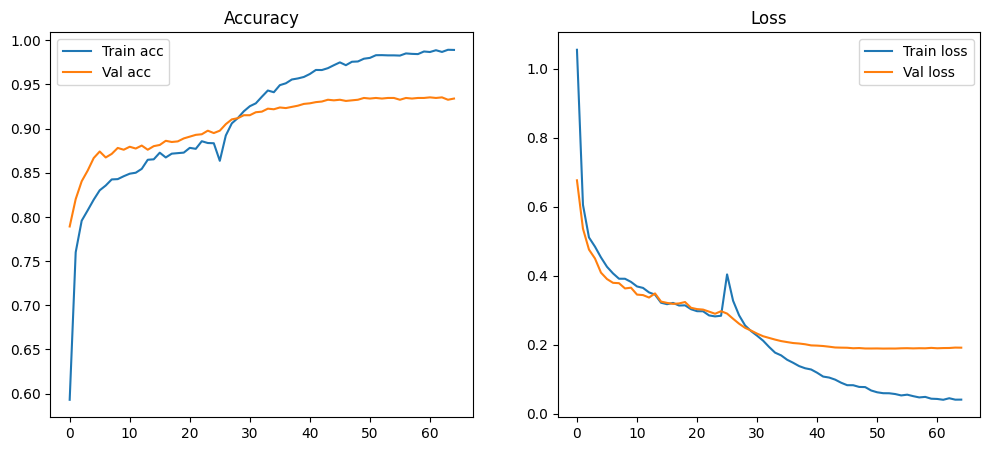

In [28]:
import json

def plot_history(h1, h2=None):
    acc = h1['history']['accuracy']
    val_acc = h1['history']['val_accuracy']
    loss = h1['history']['loss']
    val_loss = h1['history']['val_loss']
    if h2:
        acc = acc + h2['history']['accuracy']
        val_acc = val_acc + h2['history']['val_accuracy']
        loss = loss + h2['history']['loss']
        val_loss = val_loss + h2['history']['val_loss']

    epochs_range = range(len(acc))
    plt.figure(figsize=(12,5))
    plt.subplot(1,2,1)
    plt.plot(epochs_range, acc, label='Train acc')
    plt.plot(epochs_range, val_acc, label='Val acc')
    plt.legend()
    plt.title('Accuracy')

    plt.subplot(1,2,2)
    plt.plot(epochs_range, loss, label='Train loss')
    plt.plot(epochs_range, val_loss, label='Val loss')
    plt.legend()
    plt.title('Loss')
    plt.show()

# cargar history1 y history2
with open("training_history1.json", "r") as f:
    h1 = json.load(f)

with open("training_history2.json", "r") as f:
    h2 = json.load(f)

plot_history(h1, h2)

**Predicción de imagen o vídeo**

In [44]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import json
import os
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.efficientnet import preprocess_input as eff_preprocess
from tensorflow.keras.models import load_model

# =====================================================
# CARGAR MODELO ENTRENADO
# =====================================================
model_path = "final_effnetB3_classifier_6classes.keras"
model = load_model(model_path)

# Cargar mapeo real de las clases
class_indices_path='class_indices.json'
with open(class_indices_path, 'r') as f:
    class_indices = json.load(f)
inv_class_indices = {v: k for k, v in class_indices.items()}

def predict_image(img_path, show=True):
    """Predice una imagen individual"""
    img = image.load_img(img_path, target_size=(300, 300))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = eff_preprocess(img_array)

    preds = model.predict(img_array)
    class_idx = np.argmax(preds[0])
    label = inv_class_indices[class_idx]
    confidence = preds[0][class_idx]

    if show:
        plt.imshow(np.array(img).astype("uint8"))
        plt.title(f"{label} ({confidence*100:.2f}%)")
        plt.axis("off")
        plt.show()

    print("\n🔍 Predicciones:")
    for idx, prob in enumerate(preds[0]):
        print(f"  {inv_class_indices[idx]}: {prob:.3f}")
    print(f"\n✅ Predicción final: {label} ({confidence:.2%})")

    return label, confidence

def predict_video(video_path, frame_skip=30, max_frames=100, plot=True):
    """
    Procesa un video extrayendo frames cada 'frame_skip' frames.
    Retorna la predicción promedio del video y el historial frame a frame.
    """
    cap = cv2.VideoCapture(video_path)
    frames = []
    frame_count = 0

    if not cap.isOpened():
        print(f"❌ Error al abrir el video: {video_path}")
        return None, None, None

    print(f"🎞 Procesando video: {os.path.basename(video_path)}")

    while True:
        ret, frame = cap.read()
        if not ret or len(frames) >= max_frames:
            break
        if frame_count % frame_skip == 0:
            frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frame_resized = cv2.resize(frame_rgb, (300, 300))
            frame_preprocessed = eff_preprocess(np.expand_dims(frame_resized, axis=0))
            frames.append(frame_preprocessed)
        frame_count += 1

    cap.release()

    if not frames:
        print("⚠️ No se extrajeron frames.")
        return None, None, None

    frames_array = np.vstack(frames)
    preds = model.predict(frames_array, batch_size=8, verbose=0)

    # Promedio de probabilidades
    mean_pred = np.mean(preds, axis=0)
    class_idx = np.argmax(mean_pred)
    label = inv_class_indices[class_idx]
    confidence = mean_pred[class_idx]

    print(f"✅ Predicción final: {label} ({confidence*100:.2f}%) — {len(preds)} frames")

    # ===== Visualización de evolución frame a frame =====
    if plot:
        plt.figure(figsize=(10, 5))
        for i, cls in enumerate(inv_class_indices):
            plt.plot([p[i] for p in preds], label=cls)
        plt.title(f"Evolución de predicciones — {os.path.basename(video_path)}")
        plt.xlabel("Frame")
        plt.ylabel("Probabilidad")
        plt.legend(loc="upper right")
        plt.show()

    # return label, confidence, preds

    print("\n🧾 RESULTADOS FINALES:")
    print(f"Etiqueta predicha: {label}")
    print(f"Confianza: {confidence*100:.2f}%")
    print(f"Número de frames analizados: {len(preds)}")


def predict_video_streamlit(video_path, num_samples=10, target_size=(300, 300)):
    """Predice un video seleccionando solo N frames equidistantes."""

    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        return None, None, None

    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    if total_frames == 0:
        return None, None, None

    # Elegir 5 frames equidistantes
    frame_indices = np.linspace(0, total_frames - 1, num_samples, dtype=int)

    frames = []

    for frame_id in frame_indices:
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_id)
        ret, frame = cap.read()
        if not ret:
            continue

        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frame_resized = cv2.resize(frame_rgb, target_size)
        frame_preprocessed = eff_preprocess(np.expand_dims(frame_resized, axis=0))
        frames.append(frame_preprocessed)

    cap.release()

    if not frames:
        return None, None, None

    frames_array = np.vstack(frames)
    preds = model.predict(frames_array, batch_size=5, verbose=0)

    mean_preds = np.mean(preds, axis=0)
    idx = np.argmax(mean_preds)

    return inv_class_indices[idx], mean_preds[idx], preds


**Prueba de Imagen y Vídeo**

1/1 ━━━━━━━━━━━━━━━━━━━━ 18s 18s/step


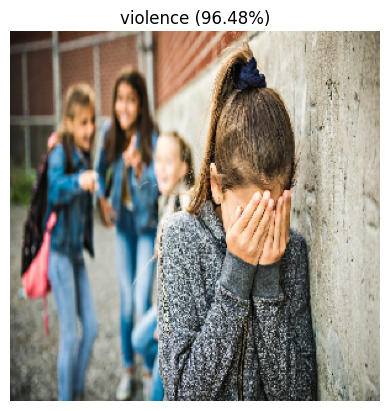


🔍 Predicciones:
  drugs: 0.020
  safe: 0.010
  sexual: 0.002
  violence: 0.965
  war: 0.002
  weapons: 0.001

✅ Predicción final: violence (96.48%)


In [31]:
img_path = "test_01.jpg"
label, confidence = predict_image(img_path)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


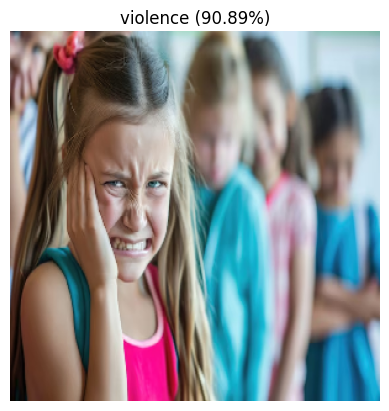


🔍 Predicciones:
  drugs: 0.025
  safe: 0.055
  sexual: 0.011
  violence: 0.909
  war: 0.000
  weapons: 0.000

✅ Predicción final: violence (90.89%)
Predicción: violence (90.89%)


In [32]:
img_path = "test_02.jpg"
label, confidence = predict_image(img_path)
print(f"Predicción: {label} ({confidence*100:.2f}%)")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


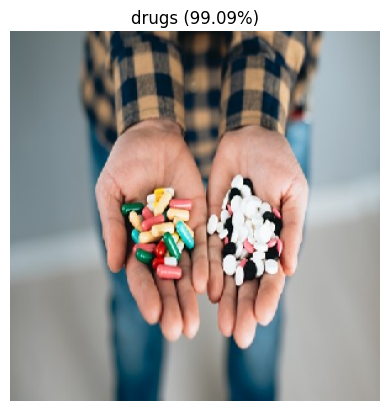


🔍 Predicciones:
  drugs: 0.991
  safe: 0.001
  sexual: 0.008
  violence: 0.000
  war: 0.000
  weapons: 0.000

✅ Predicción final: drugs (99.09%)


In [33]:
img_path = "test_03.jpg"
label, confidence = predict_image(img_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


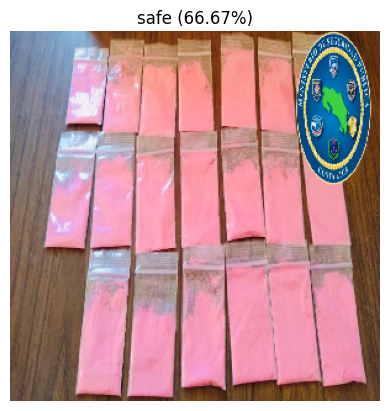


🔍 Predicciones:
  drugs: 0.326
  safe: 0.667
  sexual: 0.001
  violence: 0.000
  war: 0.004
  weapons: 0.002

✅ Predicción final: safe (66.67%)


In [34]:
img_path = "test_04.jpg"
label, confidence = predict_image(img_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


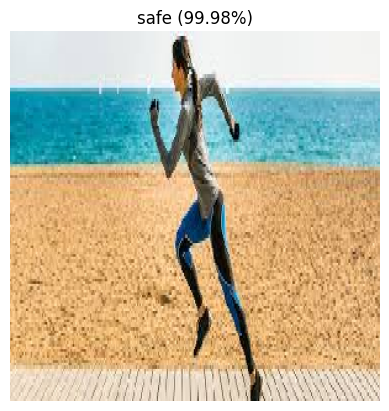


🔍 Predicciones:
  drugs: 0.000
  safe: 1.000
  sexual: 0.000
  violence: 0.000
  war: 0.000
  weapons: 0.000

✅ Predicción final: safe (99.98%)


In [35]:
img_path = "test_05.jpeg"
label, confidence = predict_image(img_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


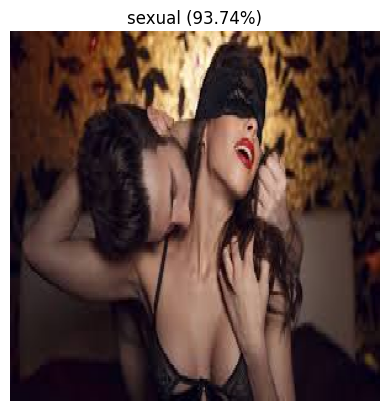


🔍 Predicciones:
  drugs: 0.001
  safe: 0.057
  sexual: 0.937
  violence: 0.004
  war: 0.000
  weapons: 0.000

✅ Predicción final: sexual (93.74%)


In [36]:
img_path = "test_06.jpeg"
label, confidence = predict_image(img_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


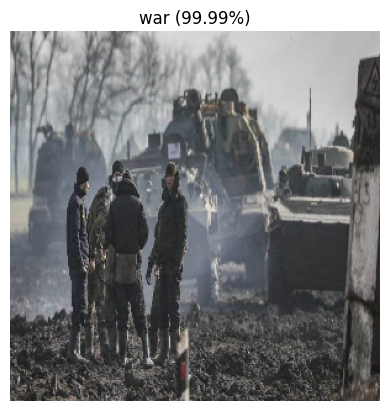


🔍 Predicciones:
  drugs: 0.000
  safe: 0.000
  sexual: 0.000
  violence: 0.000
  war: 1.000
  weapons: 0.000

✅ Predicción final: war (99.99%)


In [37]:
img_path = "test_07.jpg"
label, confidence = predict_image(img_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


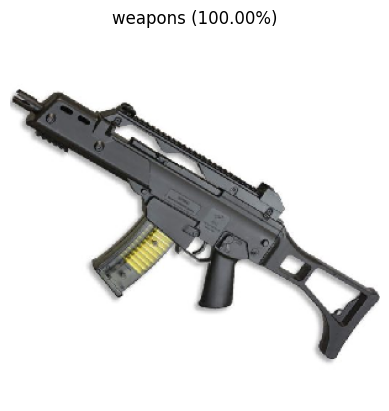


🔍 Predicciones:
  drugs: 0.000
  safe: 0.000
  sexual: 0.000
  violence: 0.000
  war: 0.000
  weapons: 1.000

✅ Predicción final: weapons (100.00%)


In [38]:
img_path = "test_08.jpg"
label, confidence = predict_image(img_path)

🎞 Procesando video: 14667078_2560_1440_60fps.mp4
✅ Predicción final: safe (82.38%) — 53 frames


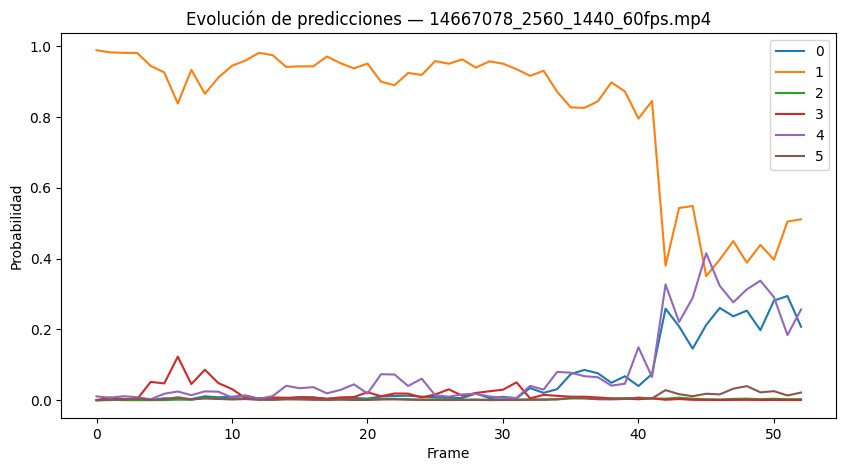


🧾 RESULTADOS FINALES:
Etiqueta predicha: safe
Confianza: 82.38%
Número de frames analizados: 53


In [45]:
video_path = "https://videos.pexels.com/video-files/34607404/14667078_2560_1440_60fps.mp4"
predict_video(video_path, frame_skip=20, plot=True)

1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step


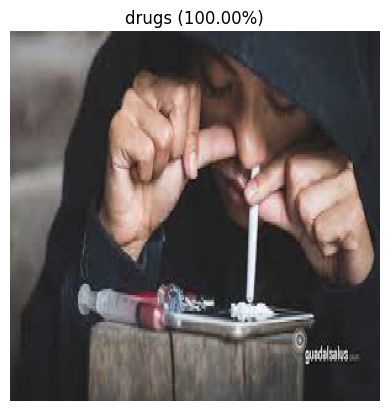


🔍 Predicciones:
  drugs: 1.000
  safe: 0.000
  sexual: 0.000
  violence: 0.000
  war: 0.000
  weapons: 0.000

✅ Predicción final: drugs (100.00%)


In [46]:
img_path = "test_09.jpg"
label, confidence = predict_image(img_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


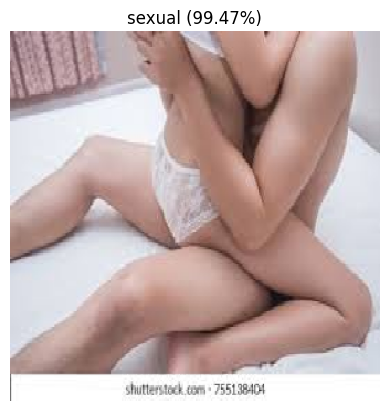


🔍 Predicciones:
  drugs: 0.000
  safe: 0.005
  sexual: 0.995
  violence: 0.000
  war: 0.000
  weapons: 0.000

✅ Predicción final: sexual (99.47%)


In [47]:
img_path = "test_10.jpg"
label, confidence = predict_image(img_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


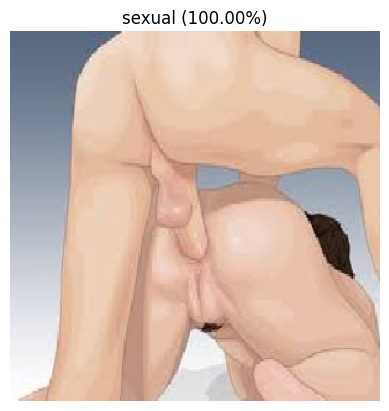


🔍 Predicciones:
  drugs: 0.000
  safe: 0.000
  sexual: 1.000
  violence: 0.000
  war: 0.000
  weapons: 0.000

✅ Predicción final: sexual (100.00%)


In [48]:
img_path = "test_11.jpg"
label, confidence = predict_image(img_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


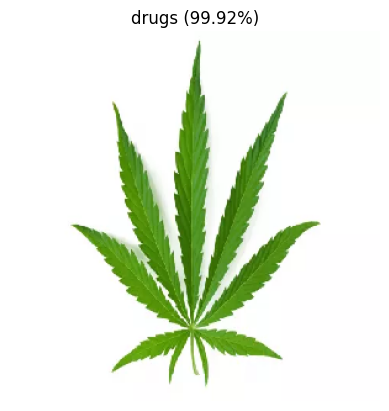


🔍 Predicciones:
  drugs: 0.999
  safe: 0.000
  sexual: 0.000
  violence: 0.000
  war: 0.000
  weapons: 0.001

✅ Predicción final: drugs (99.92%)


In [49]:
img_path = "test_12.jpg"
label, confidence = predict_image(img_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


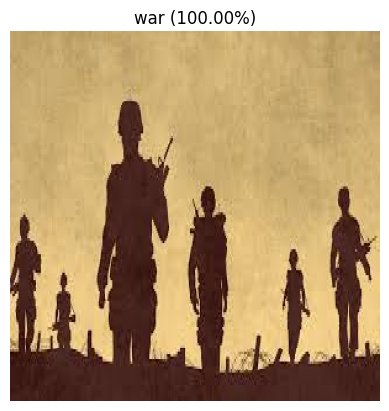


🔍 Predicciones:
  drugs: 0.000
  safe: 0.000
  sexual: 0.000
  violence: 0.000
  war: 1.000
  weapons: 0.000

✅ Predicción final: war (100.00%)


In [50]:
img_path = "test_13.jpg"
label, confidence = predict_image(img_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


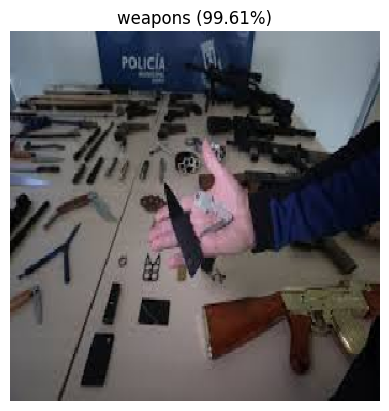


🔍 Predicciones:
  drugs: 0.000
  safe: 0.001
  sexual: 0.000
  violence: 0.002
  war: 0.001
  weapons: 0.996

✅ Predicción final: weapons (99.61%)


In [51]:
img_path = "test_14.jpg"
label, confidence = predict_image(img_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


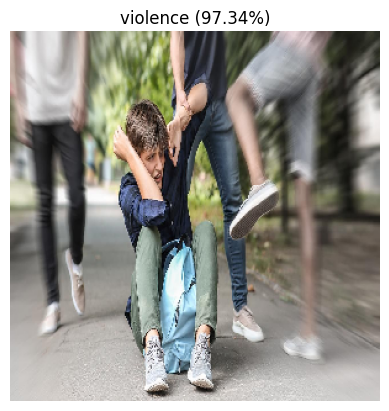


🔍 Predicciones:
  drugs: 0.009
  safe: 0.015
  sexual: 0.001
  violence: 0.973
  war: 0.000
  weapons: 0.001

✅ Predicción final: violence (97.34%)


In [52]:
img_path = "test_15.jpg"
label, confidence = predict_image(img_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


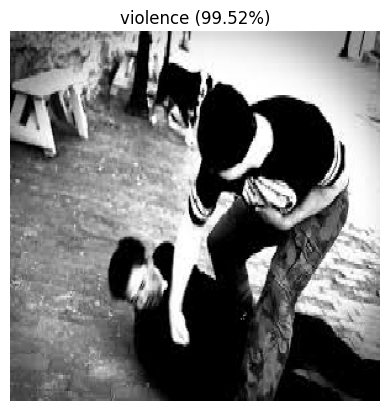


🔍 Predicciones:
  drugs: 0.000
  safe: 0.001
  sexual: 0.001
  violence: 0.995
  war: 0.002
  weapons: 0.000

✅ Predicción final: violence (99.52%)


In [53]:
img_path = "test_16.jpg"
label, confidence = predict_image(img_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


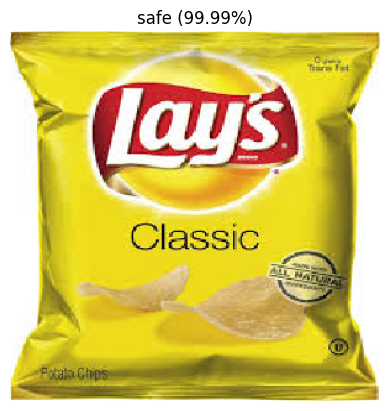


🔍 Predicciones:
  drugs: 0.000
  safe: 1.000
  sexual: 0.000
  violence: 0.000
  war: 0.000
  weapons: 0.000

✅ Predicción final: safe (99.99%)


In [54]:
img_path = "test_17.jpg"
label, confidence = predict_image(img_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


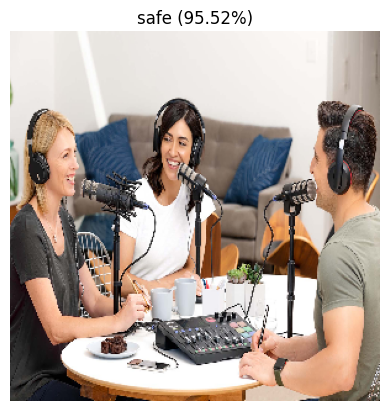


🔍 Predicciones:
  drugs: 0.009
  safe: 0.955
  sexual: 0.018
  violence: 0.000
  war: 0.005
  weapons: 0.013

✅ Predicción final: safe (95.52%)


In [55]:
img_path = "test_18.jpg"
label, confidence = predict_image(img_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


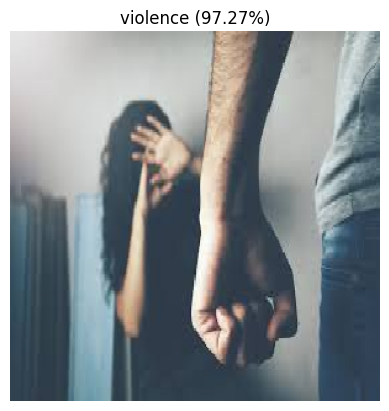


🔍 Predicciones:
  drugs: 0.014
  safe: 0.002
  sexual: 0.009
  violence: 0.973
  war: 0.000
  weapons: 0.002

✅ Predicción final: violence (97.27%)


In [56]:
img_path = "test_19.jpg"
label, confidence = predict_image(img_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


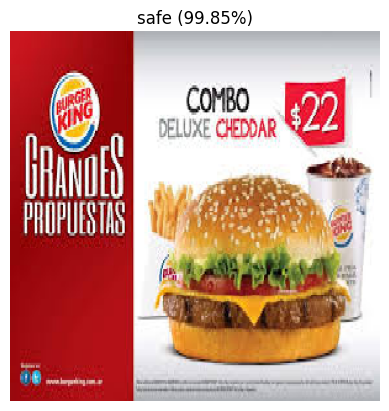


🔍 Predicciones:
  drugs: 0.001
  safe: 0.998
  sexual: 0.000
  violence: 0.000
  war: 0.000
  weapons: 0.000

✅ Predicción final: safe (99.85%)


In [57]:
img_path = "test_20.jpg"
label, confidence = predict_image(img_path)

**Bateria de prueba con N imágenes tomadas del CSV**

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


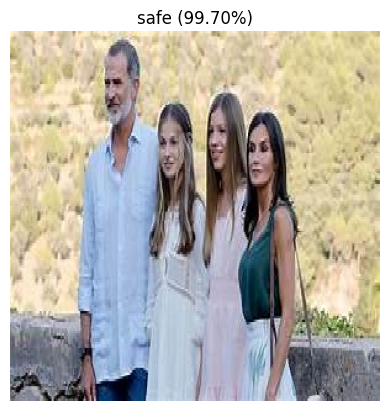


🔍 Predicciones:
  drugs: 0.001
  safe: 0.997
  sexual: 0.001
  violence: 0.000
  war: 0.001
  weapons: 0.000

✅ Predicción final: safe (99.70%)
[1/50] data/safe/safe34_1646.jpeg
  → True label: safe
  → Pred label: safe  (conf: 0.9970)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


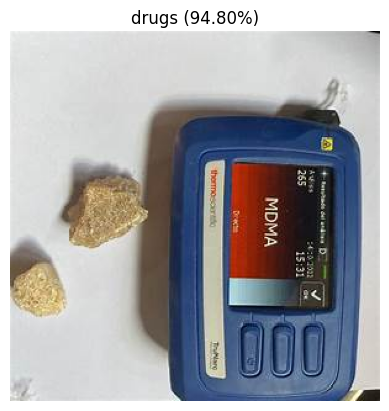


🔍 Predicciones:
  drugs: 0.948
  safe: 0.049
  sexual: 0.001
  violence: 0.001
  war: 0.000
  weapons: 0.001

✅ Predicción final: drugs (94.80%)
[2/50] data/drugs/drugs4_0793.jpeg
  → True label: drugs
  → Pred label: drugs  (conf: 0.9480)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


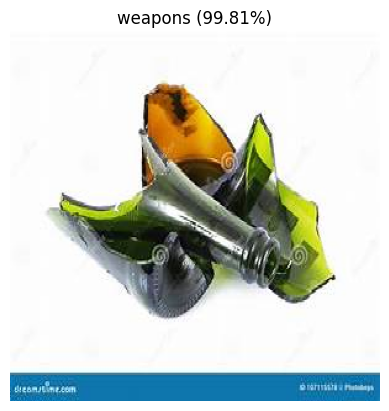


🔍 Predicciones:
  drugs: 0.001
  safe: 0.001
  sexual: 0.000
  violence: 0.000
  war: 0.000
  weapons: 0.998

✅ Predicción final: weapons (99.81%)
[3/50] data/weapons/weapons43_0609.jpeg
  → True label: weapons
  → Pred label: weapons  (conf: 0.9981)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


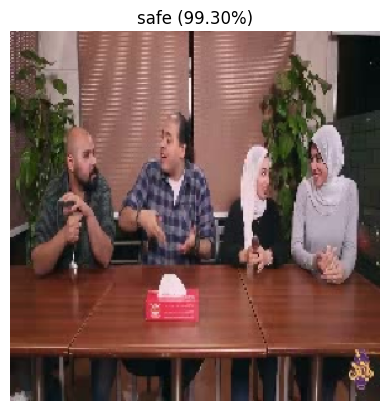


🔍 Predicciones:
  drugs: 0.003
  safe: 0.993
  sexual: 0.001
  violence: 0.001
  war: 0.001
  weapons: 0.001

✅ Predicción final: safe (99.30%)
[4/50] data/safe/frames/train/frame_NV_880_000003.jpg
  → True label: safe
  → Pred label: safe  (conf: 0.9930)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


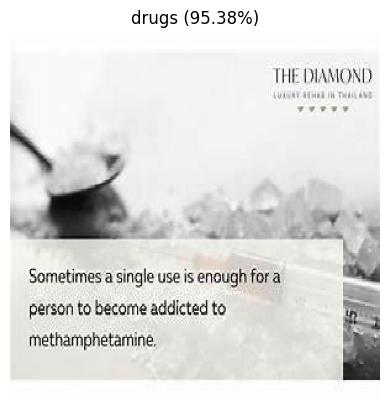


🔍 Predicciones:
  drugs: 0.954
  safe: 0.006
  sexual: 0.000
  violence: 0.003
  war: 0.027
  weapons: 0.010

✅ Predicción final: drugs (95.38%)
[5/50] data/drugs/drugs4_1166.jpeg
  → True label: drugs
  → Pred label: drugs  (conf: 0.9538)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


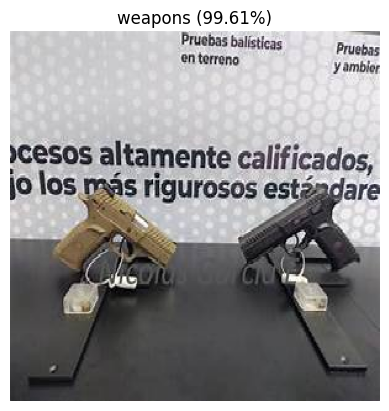


🔍 Predicciones:
  drugs: 0.002
  safe: 0.002
  sexual: 0.000
  violence: 0.000
  war: 0.000
  weapons: 0.996

✅ Predicción final: weapons (99.61%)
[6/50] data/weapons/weapons43_0499.jpeg
  → True label: weapons
  → Pred label: weapons  (conf: 0.9961)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


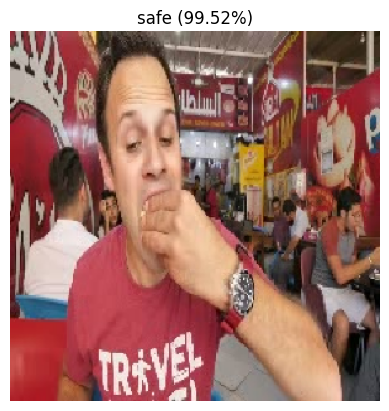


🔍 Predicciones:
  drugs: 0.000
  safe: 0.995
  sexual: 0.000
  violence: 0.004
  war: 0.000
  weapons: 0.000

✅ Predicción final: safe (99.52%)
[7/50] data/safe/frames/train/frame_NV_793_000002.jpg
  → True label: safe
  → Pred label: safe  (conf: 0.9952)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


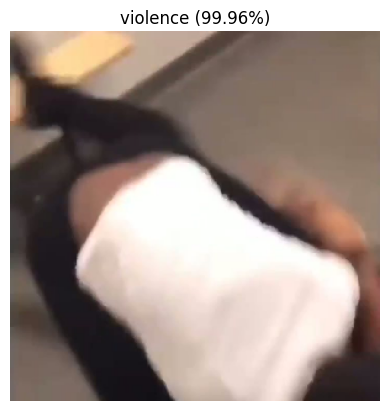


🔍 Predicciones:
  drugs: 0.000
  safe: 0.000
  sexual: 0.000
  violence: 1.000
  war: 0.000
  weapons: 0.000

✅ Predicción final: violence (99.96%)
[8/50] data/violence/frames/train/frame_V_781_000002.jpg
  → True label: violence
  → Pred label: violence  (conf: 0.9996)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


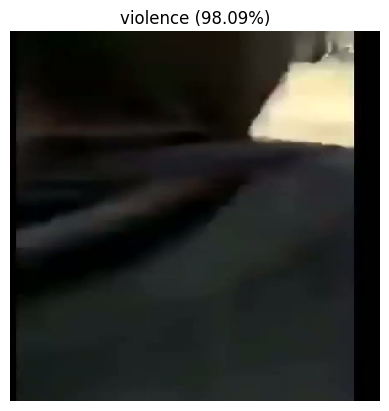


🔍 Predicciones:
  drugs: 0.001
  safe: 0.017
  sexual: 0.000
  violence: 0.981
  war: 0.000
  weapons: 0.001

✅ Predicción final: violence (98.09%)
[9/50] data/violence/frames/train/frame_V_219_000003.jpg
  → True label: violence
  → Pred label: violence  (conf: 0.9809)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


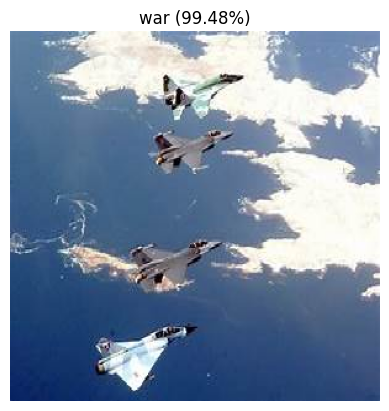


🔍 Predicciones:
  drugs: 0.003
  safe: 0.002
  sexual: 0.000
  violence: 0.000
  war: 0.995
  weapons: 0.000

✅ Predicción final: war (99.48%)
[10/50] data/war/war35_0672.jpeg
  → True label: war
  → Pred label: war  (conf: 0.9948)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


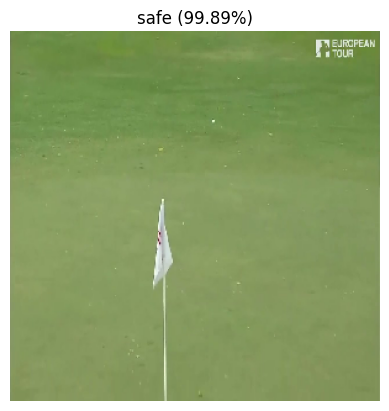


🔍 Predicciones:
  drugs: 0.000
  safe: 0.999
  sexual: 0.000
  violence: 0.000
  war: 0.001
  weapons: 0.000

✅ Predicción final: safe (99.89%)
[11/50] data/safe/frames/train/frame_NV_857_000001.jpg
  → True label: safe
  → Pred label: safe  (conf: 0.9989)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


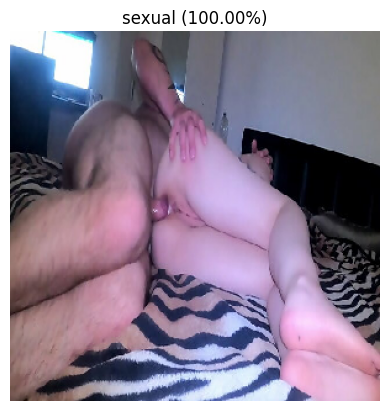


🔍 Predicciones:
  drugs: 0.000
  safe: 0.000
  sexual: 1.000
  violence: 0.000
  war: 0.000
  weapons: 0.000

✅ Predicción final: sexual (100.00%)
[12/50] data/sexual/sexual34_1027.jpg
  → True label: sexual
  → Pred label: sexual  (conf: 1.0000)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


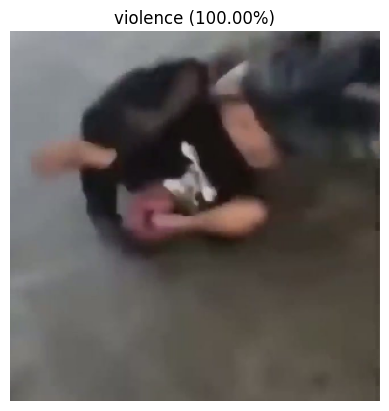


🔍 Predicciones:
  drugs: 0.000
  safe: 0.000
  sexual: 0.000
  violence: 1.000
  war: 0.000
  weapons: 0.000

✅ Predicción final: violence (100.00%)
[13/50] data/violence/frames/train/frame_V_29_000003.jpg
  → True label: violence
  → Pred label: violence  (conf: 1.0000)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


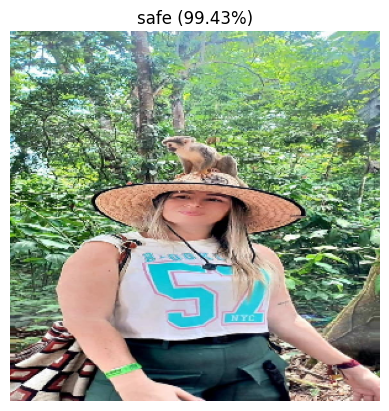


🔍 Predicciones:
  drugs: 0.003
  safe: 0.994
  sexual: 0.001
  violence: 0.000
  war: 0.000
  weapons: 0.001

✅ Predicción final: safe (99.43%)
[14/50] data/safe/safe34_0052.jpg
  → True label: safe
  → Pred label: safe  (conf: 0.9943)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


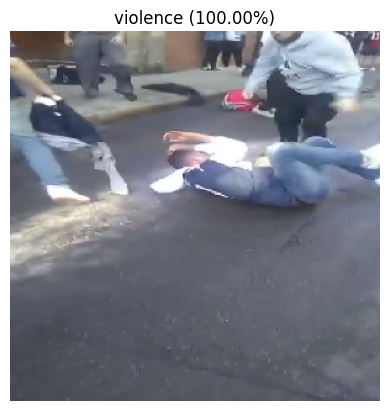


🔍 Predicciones:
  drugs: 0.000
  safe: 0.000
  sexual: 0.000
  violence: 1.000
  war: 0.000
  weapons: 0.000

✅ Predicción final: violence (100.00%)
[15/50] data/violence/frames/train/frame_V_972_000002.jpg
  → True label: violence
  → Pred label: violence  (conf: 1.0000)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


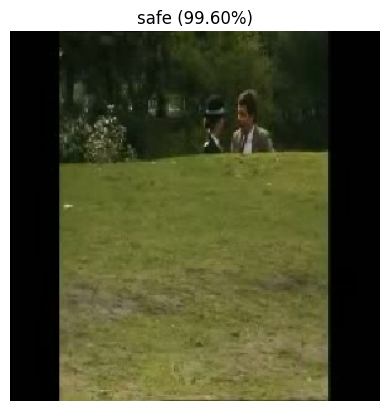


🔍 Predicciones:
  drugs: 0.000
  safe: 0.996
  sexual: 0.000
  violence: 0.004
  war: 0.000
  weapons: 0.000

✅ Predicción final: safe (99.60%)
[16/50] data/safe/frames/train/frame_NV_416_000003.jpg
  → True label: safe
  → Pred label: safe  (conf: 0.9960)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


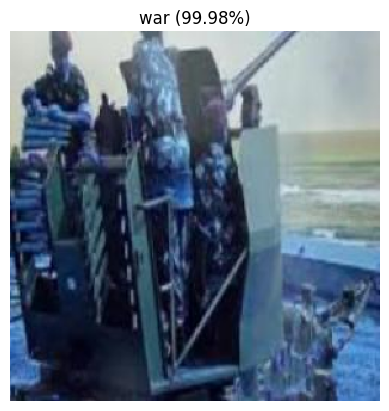


🔍 Predicciones:
  drugs: 0.000
  safe: 0.000
  sexual: 0.000
  violence: 0.000
  war: 1.000
  weapons: 0.000

✅ Predicción final: war (99.98%)
[17/50] data/war/war35_1067.jpg
  → True label: war
  → Pred label: war  (conf: 0.9998)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


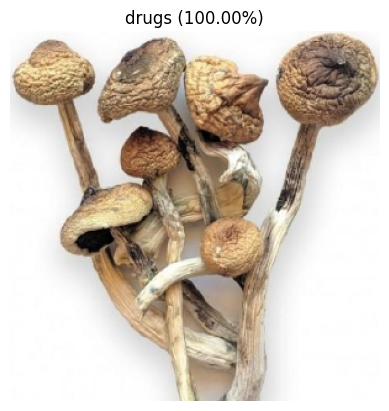


🔍 Predicciones:
  drugs: 1.000
  safe: 0.000
  sexual: 0.000
  violence: 0.000
  war: 0.000
  weapons: 0.000

✅ Predicción final: drugs (100.00%)
[18/50] data/drugs/drugs4_0460.jpg
  → True label: drugs
  → Pred label: drugs  (conf: 1.0000)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


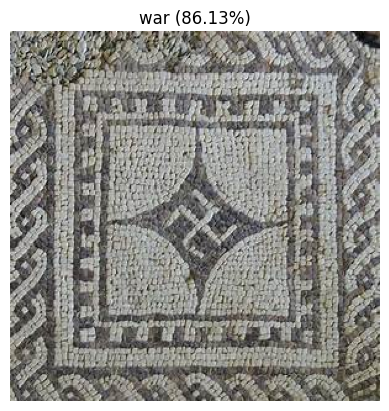


🔍 Predicciones:
  drugs: 0.003
  safe: 0.128
  sexual: 0.000
  violence: 0.001
  war: 0.861
  weapons: 0.007

✅ Predicción final: war (86.13%)
[19/50] data/war/war35_0001.jpeg
  → True label: war
  → Pred label: war  (conf: 0.8613)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


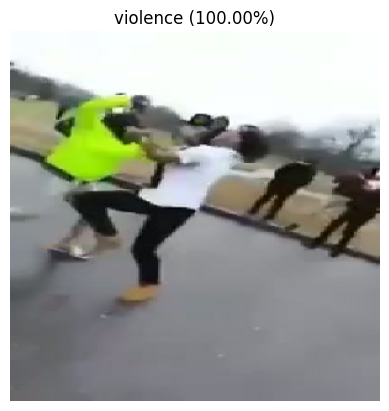


🔍 Predicciones:
  drugs: 0.000
  safe: 0.000
  sexual: 0.000
  violence: 1.000
  war: 0.000
  weapons: 0.000

✅ Predicción final: violence (100.00%)
[20/50] data/violence/frames/val/frame_V_917_000002.jpg
  → True label: violence
  → Pred label: violence  (conf: 1.0000)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


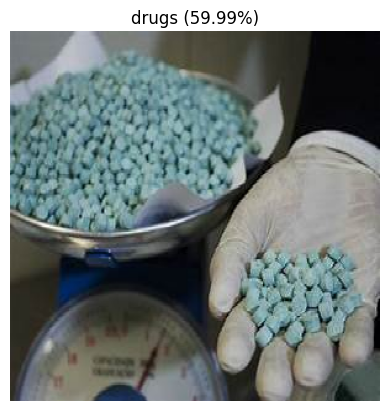


🔍 Predicciones:
  drugs: 0.600
  safe: 0.400
  sexual: 0.000
  violence: 0.000
  war: 0.000
  weapons: 0.000

✅ Predicción final: drugs (59.99%)
[21/50] data/drugs/drugs4_0665.jpeg
  → True label: drugs
  → Pred label: drugs  (conf: 0.5999)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


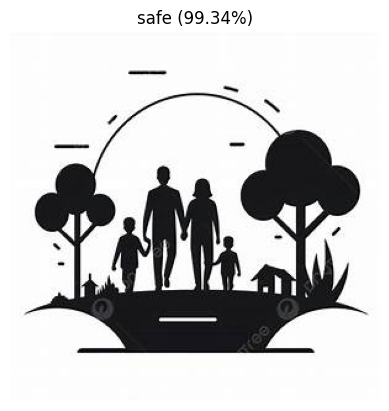


🔍 Predicciones:
  drugs: 0.001
  safe: 0.993
  sexual: 0.003
  violence: 0.000
  war: 0.001
  weapons: 0.002

✅ Predicción final: safe (99.34%)
[22/50] data/safe/safe34_1915.jpeg
  → True label: safe
  → Pred label: safe  (conf: 0.9934)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


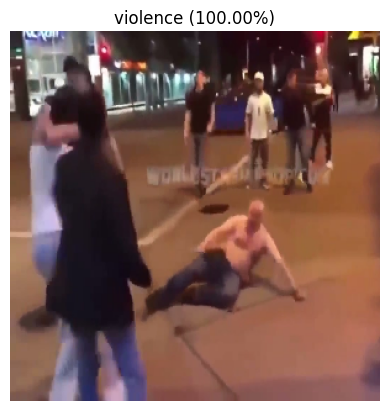


🔍 Predicciones:
  drugs: 0.000
  safe: 0.000
  sexual: 0.000
  violence: 1.000
  war: 0.000
  weapons: 0.000

✅ Predicción final: violence (100.00%)
[23/50] data/violence/frames/train/frame_V_20_000002.jpg
  → True label: violence
  → Pred label: violence  (conf: 1.0000)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


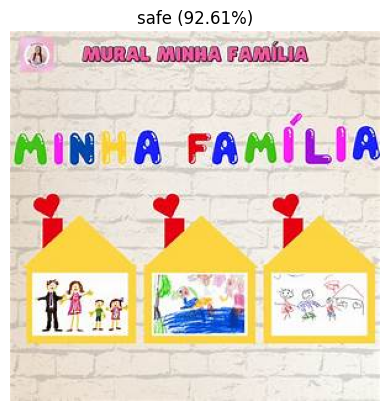


🔍 Predicciones:
  drugs: 0.063
  safe: 0.926
  sexual: 0.000
  violence: 0.000
  war: 0.010
  weapons: 0.001

✅ Predicción final: safe (92.61%)
[24/50] data/safe/safe34_2542.jpeg
  → True label: safe
  → Pred label: safe  (conf: 0.9261)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


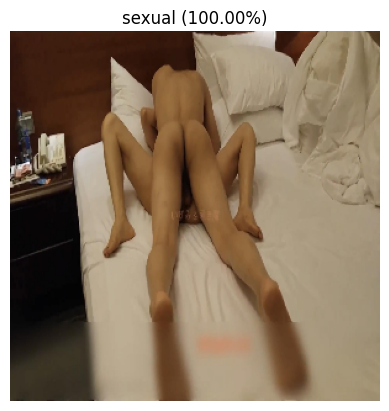


🔍 Predicciones:
  drugs: 0.000
  safe: 0.000
  sexual: 1.000
  violence: 0.000
  war: 0.000
  weapons: 0.000

✅ Predicción final: sexual (100.00%)
[25/50] data/sexual/sexual34_1714.jpg
  → True label: sexual
  → Pred label: sexual  (conf: 1.0000)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


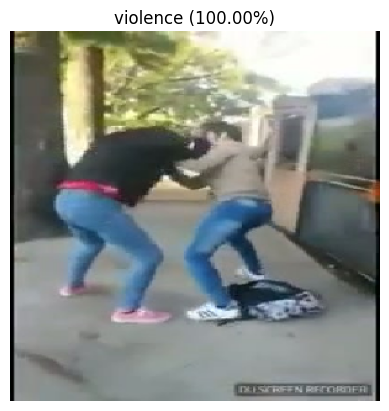


🔍 Predicciones:
  drugs: 0.000
  safe: 0.000
  sexual: 0.000
  violence: 1.000
  war: 0.000
  weapons: 0.000

✅ Predicción final: violence (100.00%)
[26/50] data/violence/frames/train/frame_V_174_000003.jpg
  → True label: violence
  → Pred label: violence  (conf: 1.0000)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


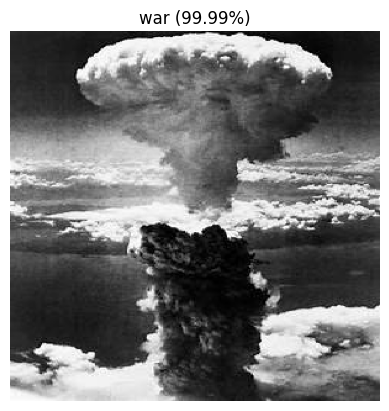


🔍 Predicciones:
  drugs: 0.000
  safe: 0.000
  sexual: 0.000
  violence: 0.000
  war: 1.000
  weapons: 0.000

✅ Predicción final: war (99.99%)
[27/50] data/war/war35_0170.jpeg
  → True label: war
  → Pred label: war  (conf: 0.9999)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


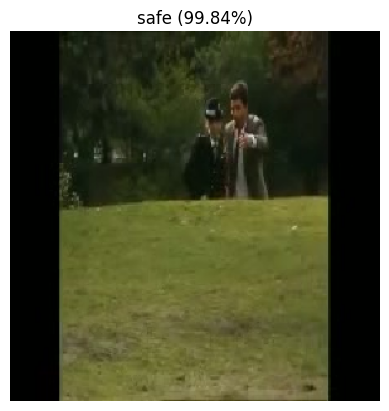


🔍 Predicciones:
  drugs: 0.000
  safe: 0.998
  sexual: 0.000
  violence: 0.001
  war: 0.000
  weapons: 0.000

✅ Predicción final: safe (99.84%)
[28/50] data/safe/frames/train/frame_NV_418_000002.jpg
  → True label: safe
  → Pred label: safe  (conf: 0.9984)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


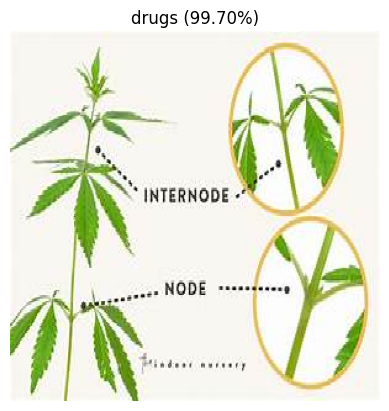


🔍 Predicciones:
  drugs: 0.997
  safe: 0.002
  sexual: 0.000
  violence: 0.000
  war: 0.000
  weapons: 0.001

✅ Predicción final: drugs (99.70%)
[29/50] data/drugs/drugs4_0783.jpeg
  → True label: drugs
  → Pred label: drugs  (conf: 0.9970)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


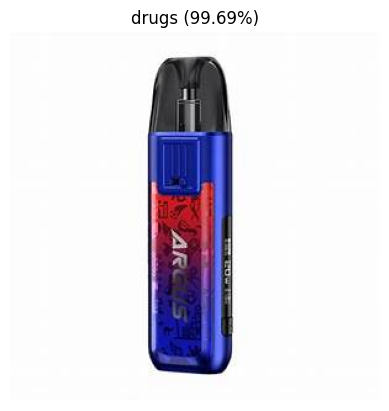


🔍 Predicciones:
  drugs: 0.997
  safe: 0.002
  sexual: 0.000
  violence: 0.000
  war: 0.000
  weapons: 0.001

✅ Predicción final: drugs (99.69%)
[30/50] data/drugs/drugs4_1641.jpeg
  → True label: drugs
  → Pred label: drugs  (conf: 0.9969)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


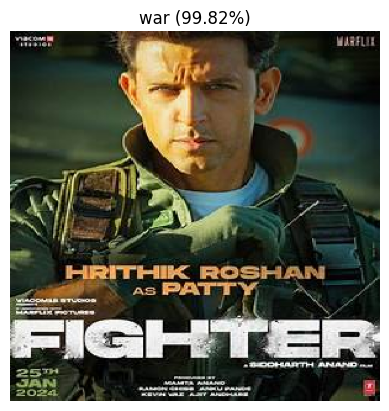


🔍 Predicciones:
  drugs: 0.000
  safe: 0.001
  sexual: 0.000
  violence: 0.000
  war: 0.998
  weapons: 0.000

✅ Predicción final: war (99.82%)
[31/50] data/safe/safe34_2419.jpeg
  → True label: safe
  → Pred label: war  (conf: 0.9982)
  → HIT: False

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


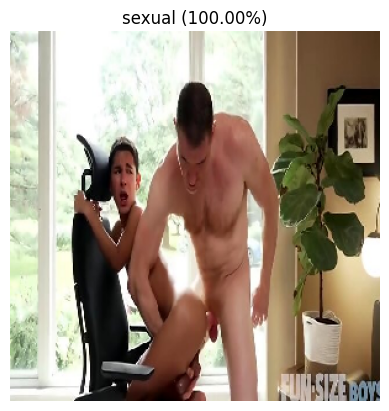


🔍 Predicciones:
  drugs: 0.000
  safe: 0.000
  sexual: 1.000
  violence: 0.000
  war: 0.000
  weapons: 0.000

✅ Predicción final: sexual (100.00%)
[32/50] data/sexual/sexual34_0320.jpg
  → True label: sexual
  → Pred label: sexual  (conf: 1.0000)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


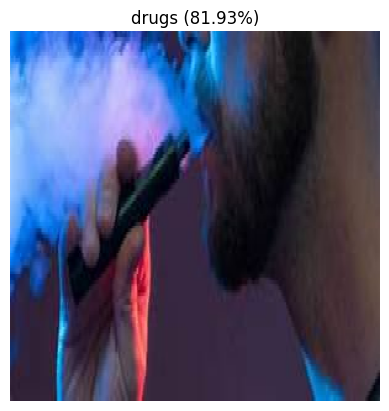


🔍 Predicciones:
  drugs: 0.819
  safe: 0.088
  sexual: 0.003
  violence: 0.022
  war: 0.063
  weapons: 0.004

✅ Predicción final: drugs (81.93%)
[33/50] data/drugs/drugs4_1649.jpeg
  → True label: drugs
  → Pred label: drugs  (conf: 0.8193)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


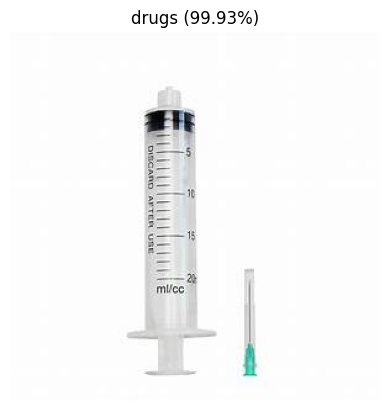


🔍 Predicciones:
  drugs: 0.999
  safe: 0.000
  sexual: 0.000
  violence: 0.000
  war: 0.000
  weapons: 0.000

✅ Predicción final: drugs (99.93%)
[34/50] data/drugs/drugs4_1030.jpeg
  → True label: drugs
  → Pred label: drugs  (conf: 0.9993)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


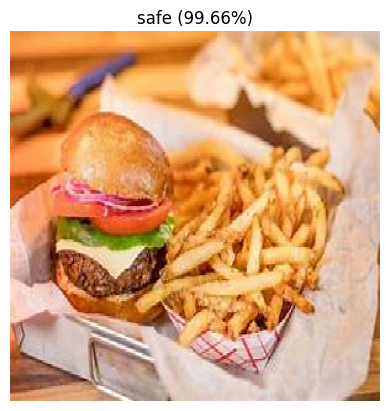


🔍 Predicciones:
  drugs: 0.001
  safe: 0.997
  sexual: 0.000
  violence: 0.002
  war: 0.000
  weapons: 0.000

✅ Predicción final: safe (99.66%)
[35/50] data/safe/safe34_1287.jpeg
  → True label: safe
  → Pred label: safe  (conf: 0.9966)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


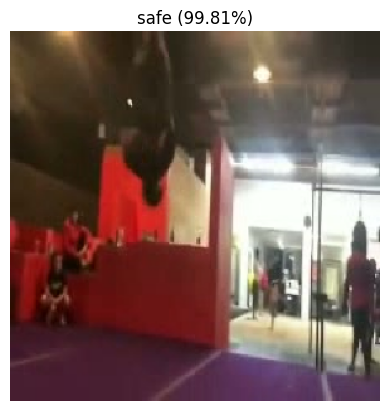


🔍 Predicciones:
  drugs: 0.000
  safe: 0.998
  sexual: 0.000
  violence: 0.001
  war: 0.000
  weapons: 0.000

✅ Predicción final: safe (99.81%)
[36/50] data/safe/frames/train/frame_NV_475_000001.jpg
  → True label: safe
  → Pred label: safe  (conf: 0.9981)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


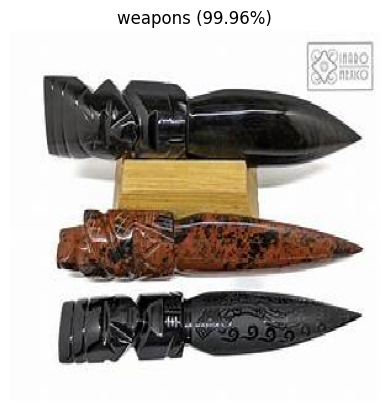


🔍 Predicciones:
  drugs: 0.000
  safe: 0.000
  sexual: 0.000
  violence: 0.000
  war: 0.000
  weapons: 1.000

✅ Predicción final: weapons (99.96%)
[37/50] data/weapons/weapons43_0533.jpeg
  → True label: weapons
  → Pred label: weapons  (conf: 0.9996)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


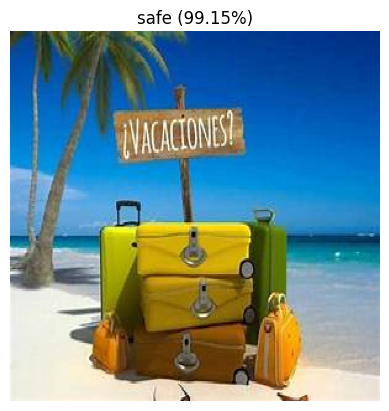


🔍 Predicciones:
  drugs: 0.000
  safe: 0.991
  sexual: 0.000
  violence: 0.000
  war: 0.008
  weapons: 0.000

✅ Predicción final: safe (99.15%)
[38/50] data/safe/safe34_1286.jpeg
  → True label: safe
  → Pred label: safe  (conf: 0.9915)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


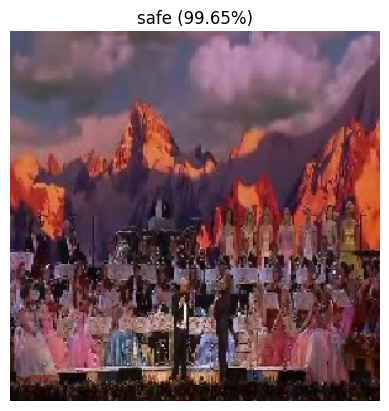


🔍 Predicciones:
  drugs: 0.000
  safe: 0.997
  sexual: 0.000
  violence: 0.000
  war: 0.003
  weapons: 0.000

✅ Predicción final: safe (99.65%)
[39/50] data/safe/frames/val/frame_NV_601_000002.jpg
  → True label: safe
  → Pred label: safe  (conf: 0.9965)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


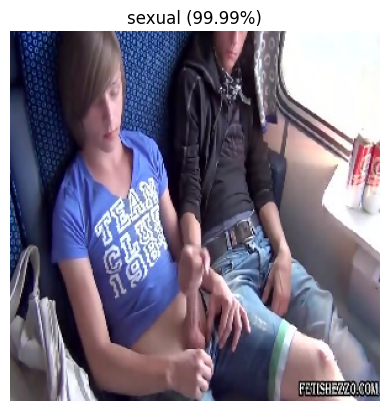


🔍 Predicciones:
  drugs: 0.000
  safe: 0.000
  sexual: 1.000
  violence: 0.000
  war: 0.000
  weapons: 0.000

✅ Predicción final: sexual (99.99%)
[40/50] data/sexual/sexual34_0675.jpg
  → True label: sexual
  → Pred label: sexual  (conf: 0.9999)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


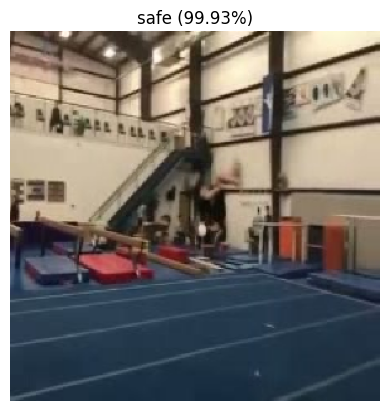


🔍 Predicciones:
  drugs: 0.000
  safe: 0.999
  sexual: 0.000
  violence: 0.000
  war: 0.000
  weapons: 0.001

✅ Predicción final: safe (99.93%)
[41/50] data/safe/frames/val/frame_NV_489_000003.jpg
  → True label: safe
  → Pred label: safe  (conf: 0.9993)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


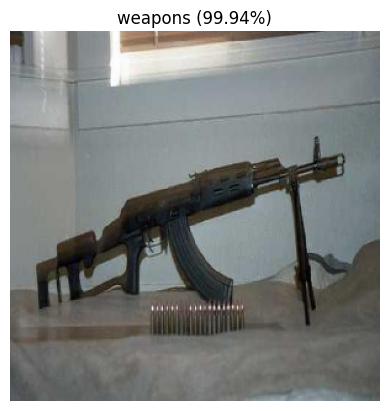


🔍 Predicciones:
  drugs: 0.000
  safe: 0.000
  sexual: 0.000
  violence: 0.000
  war: 0.000
  weapons: 0.999

✅ Predicción final: weapons (99.94%)
[42/50] data/weapons/weapons43_1258.jpg
  → True label: weapons
  → Pred label: weapons  (conf: 0.9994)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


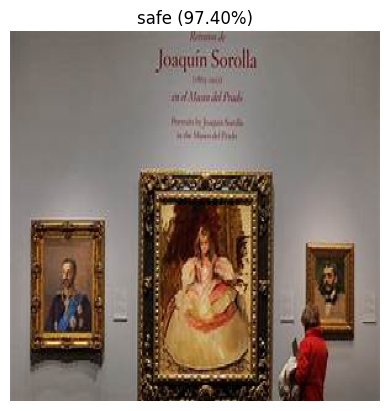


🔍 Predicciones:
  drugs: 0.001
  safe: 0.974
  sexual: 0.000
  violence: 0.000
  war: 0.025
  weapons: 0.000

✅ Predicción final: safe (97.40%)
[43/50] data/safe/safe34_0195.jpeg
  → True label: safe
  → Pred label: safe  (conf: 0.9740)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


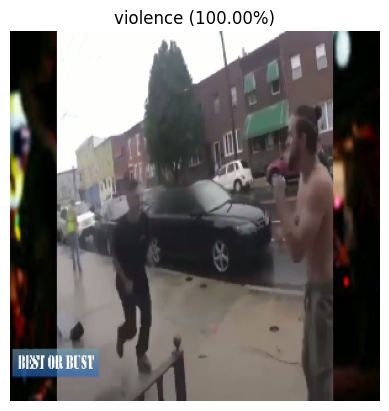


🔍 Predicciones:
  drugs: 0.000
  safe: 0.000
  sexual: 0.000
  violence: 1.000
  war: 0.000
  weapons: 0.000

✅ Predicción final: violence (100.00%)
[44/50] data/violence/frames/train/frame_V_464_000002.jpg
  → True label: violence
  → Pred label: violence  (conf: 1.0000)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


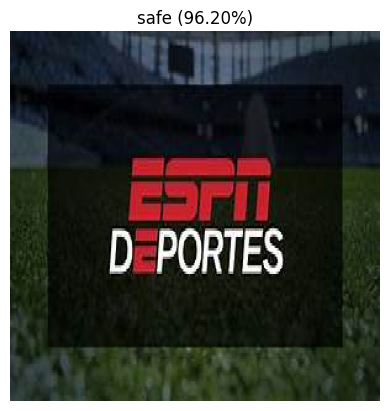


🔍 Predicciones:
  drugs: 0.001
  safe: 0.962
  sexual: 0.000
  violence: 0.003
  war: 0.033
  weapons: 0.001

✅ Predicción final: safe (96.20%)
[45/50] data/safe/safe34_2268.jpeg
  → True label: safe
  → Pred label: safe  (conf: 0.9620)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


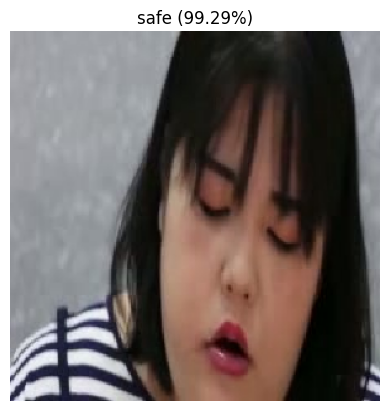


🔍 Predicciones:
  drugs: 0.003
  safe: 0.993
  sexual: 0.002
  violence: 0.002
  war: 0.000
  weapons: 0.000

✅ Predicción final: safe (99.29%)
[46/50] data/safe/frames/train/frame_NV_908_000002.jpg
  → True label: safe
  → Pred label: safe  (conf: 0.9929)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


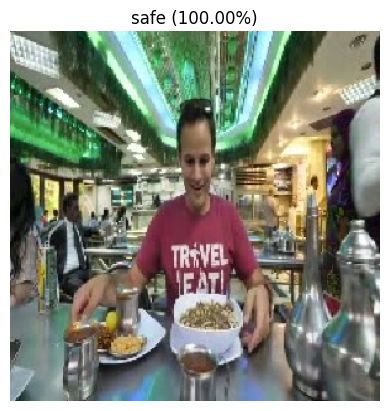


🔍 Predicciones:
  drugs: 0.000
  safe: 1.000
  sexual: 0.000
  violence: 0.000
  war: 0.000
  weapons: 0.000

✅ Predicción final: safe (100.00%)
[47/50] data/safe/frames/test/frame_NV_801_000003.jpg
  → True label: safe
  → Pred label: safe  (conf: 1.0000)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


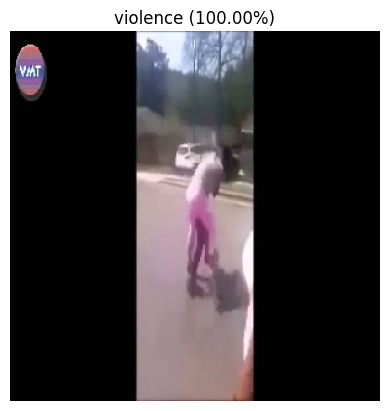


🔍 Predicciones:
  drugs: 0.000
  safe: 0.000
  sexual: 0.000
  violence: 1.000
  war: 0.000
  weapons: 0.000

✅ Predicción final: violence (100.00%)
[48/50] data/violence/frames/train/frame_V_186_000003.jpg
  → True label: violence
  → Pred label: violence  (conf: 1.0000)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


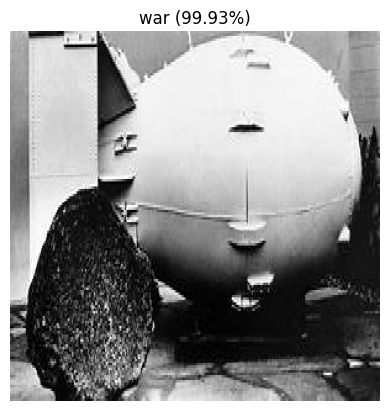


🔍 Predicciones:
  drugs: 0.000
  safe: 0.001
  sexual: 0.000
  violence: 0.000
  war: 0.999
  weapons: 0.000

✅ Predicción final: war (99.93%)
[49/50] data/war/war35_0057.jpeg
  → True label: war
  → Pred label: war  (conf: 0.9993)
  → HIT: True

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


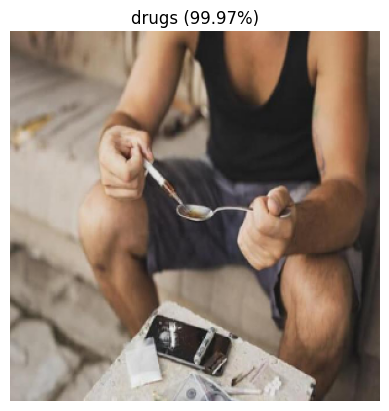


🔍 Predicciones:
  drugs: 1.000
  safe: 0.000
  sexual: 0.000
  violence: 0.000
  war: 0.000
  weapons: 0.000

✅ Predicción final: drugs (99.97%)
[50/50] data/drugs/drugs4_0302.jpg
  → True label: drugs
  → Pred label: drugs  (conf: 0.9997)
  → HIT: True


===== RESULTADOS DE LA BATERÍA DE TEST =====



,img,true_label,pred_label,confidence,hit
0,data/safe/safe34_1646.jpeg,safe,safe,0.997030,True
1,data/drugs/drugs4_0793.jpeg,drugs,drugs,0.948035,True
2,data/weapons/weapons43_0609.jpeg,weapons,weapons,0.998054,True
3,data/safe/frames/train/frame_NV_880_000003.jpg,safe,safe,0.992993,True
4,data/drugs/drugs4_1166.jpeg,drugs,drugs,0.953784,True
5,data/weapons/weapons43_0499.jpeg,weapons,weapons,0.996096,True
6,data/safe/frames/train/frame_NV_793_000002.jpg,safe,safe,0.995165,True
7,data/violence/frames/train/frame_V_781_000002.jpg,violence,violence,0.999604,True
8,data/violence/frames/train/frame_V_219_000003.jpg,violence,violence,0.980918,True
9,data/war/war35_0672.jpeg,war,war,0.994770,True



Archivo guardado como test_results.csv


In [58]:
import pandas as pd
import random

def test_random_images(model, n=50):
    # Cargar inventario limpio
    #df = pd.read_csv("data/inventory.csv")

    # Seleccionar n imágenes aleatorias diferentes en cada ejecución
    sample_df = df.sample(n=n).reset_index(drop=True)

    results = []

    for i, row in sample_df.iterrows():
        img_path = row["relative_path"]
        true_label = row["category"]

        try:
            # Predicción
            pred_label, confidence = predict_image(img_path)

            # Comparación
            hit = pred_label == true_label

            # Guardar resultados
            results.append({
                "img": img_path,
                "true_label": true_label,
                "pred_label": pred_label,
                "confidence": float(confidence),
                "hit": hit
            })

            print(f"[{i+1}/{n}] {img_path}")
            print(f"  → True label: {true_label}")
            print(f"  → Pred label: {pred_label}  (conf: {confidence:.4f})")
            print(f"  → HIT: {hit}\n")

        except Exception as e:
            print(f"Error procesando {img_path}: {e}")

    # Convertir a DataFrame para tabla
    results_df = pd.DataFrame(results)

    # Mostrar tabla antes de guardar
    print("\n===== RESULTADOS DE LA BATERÍA DE TEST =====\n")
    display(results_df)

    # Guardar resultados en CSV
    results_df.to_csv("test_results.csv", index=False)
    print("\nArchivo guardado como test_results.csv")

    return results_df

results_df = test_random_images(model, n=50)